# Outlier Detection Demonstration



## Exploratory Data Analysis
* presentation: https://www.youtube.com/watch?v=x9GUmszolgY&t=6s <br>
* pandas proflining https://github.com/pandas-profiling/pandas-profiling <br>

Ian's work (or where I learn cool stuff from) : https://ianozsvald.com/

## What is an outlier?
#### An outlier is an observation that lies an abnormal distance from other values in a random sample from a population. In a sense, this definition leaves it up to the analyst (or a consensus process) to decide what will be considered abnormal. Before abnormal observations can be singled out, it is necessary to characterize normal observations.  <br>
 source(https://www.itl.nist.gov/div898/handbook/prc/section1/prc16.htm)

## What are fake news? 
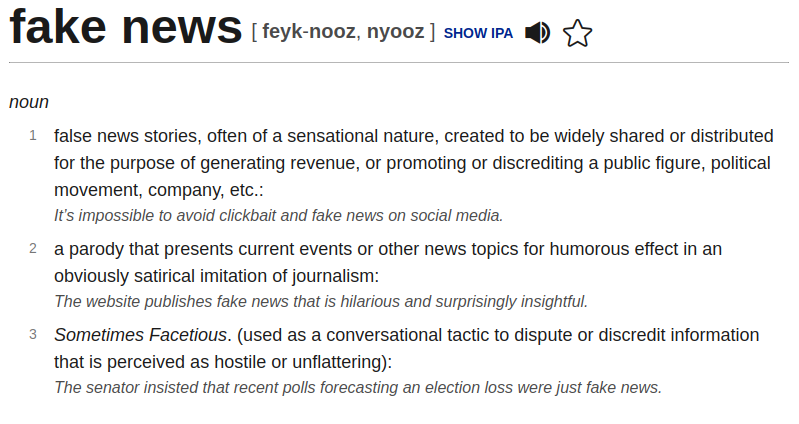
source: https://www.dictionary.com/browse/fake-news

## Are all outliers "fake news"? 
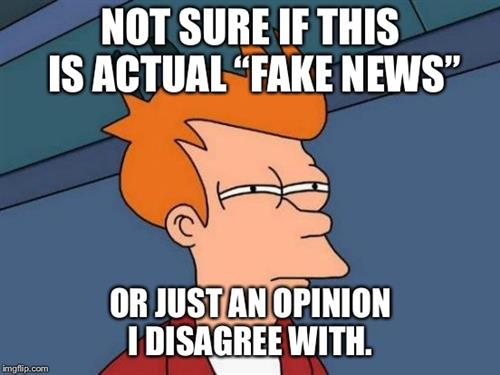

# Can I make a fake news generator?

### <font color='red'>Yes you can! </font>
#  <font color='green'> Find out how, at python pizza, on the 31st of December! </font>
https://hamburg.python.pizza/ <br>

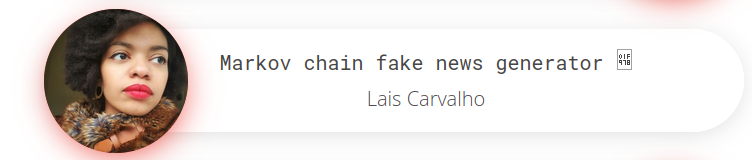

## Numenta Anomaly Benchmark 
https://numenta.com/machine-intelligence-technology/numenta-anomaly-benchmark/ <br>
Repo: https://github.com/numenta/NAB <br>
Data: https://github.com/numenta/NAB/tree/master/data

NAB is a novel benchmark for evaluating algorithms for anomaly detection in streaming, real-time applications. It is composed of over 50 labeled real-world and artificial timeseries data files plus a novel scoring mechanism designed for real-time application

In [46]:
import pandas as pd
import datetime as dt
import numpy as np
from sklearn.ensemble import IsolationForest
from fbprophet import Prophet
from sklearn.cluster import DBSCAN
from sklearn.preprocessing import StandardScaler
#visualisation
import altair as alt

#disable row limit in altair
alt.data_transformers.disable_max_rows()

DataTransformerRegistry.enable('default')

In [47]:
df = pd.read_csv("Twitter_volume_FB.csv")
df.head()

,timestamp,value
0,2015-02-26 21:42:53,53
1,2015-02-26 21:47:53,64
2,2015-02-26 21:52:53,49
3,2015-02-26 21:57:53,48
4,2015-02-26 22:02:53,22


# Isolation Forest <br>
source :https://scikit-learn.org/stable/modules/generated/sklearn.ensemble.IsolationForest.html

In [48]:
df_forest = df.copy()

In [49]:
max_features = 1.0 #The number of features to draw from df.value to train each base estimator.
n_estimators = 50 #number of base estimators
max_samples = "auto" #number of samples to draw from df.value to train each base estimator 
contamination = 0.02 #The proportion of outliers in the data set.

forest_model=IsolationForest(max_features = max_features, n_estimators=n_estimators, 
                             max_samples=max_samples, contamination=contamination)
forest_model.fit(df_forest[["value"]])

IsolationForest(contamination=0.02, n_estimators=50)

In [50]:
df_forest["scores"]=forest_model.decision_function(df_forest[["value"]]) #average anomaly score.
df_forest["anomaly"]=forest_model.predict(df_forest[["value"]]) #predict if a particular sample is an outlier or not.
df_forest.head(10)

,timestamp,value,scores,anomaly
0,2015-02-26 21:42:53,53,0.035867,1
1,2015-02-26 21:47:53,64,-0.022655,-1
2,2015-02-26 21:52:53,49,0.040336,1
3,2015-02-26 21:57:53,48,0.041005,1
4,2015-02-26 22:02:53,22,0.188951,1
5,2015-02-26 22:07:53,23,0.190382,1
6,2015-02-26 22:12:53,17,0.233688,1
7,2015-02-26 22:17:53,35,0.112846,1
8,2015-02-26 22:22:53,23,0.190382,1
9,2015-02-26 22:27:53,39,0.077389,1


In [ ]:
data_forest = alt.Chart(df_forest[df_forest.anomaly!=-1]).mark_circle(size=15, opacity=0.5, color = 'Green').encode(
        x='timestamp:T',
        y=alt.Y('value', title='number of word appearances'),    
    ).interactive()

outliers_forest = alt.Chart(df_forest[df_forest.anomaly==-1]).mark_circle(size=20, color = 'black').encode(
        x='timestamp:T',
        y=alt.Y('value', title='number of word appearances'),
    tooltip=['timestamp:T', 'value']
    ).interactive()

chart_forest = alt.layer(data_forest, outliers_forest)\
              .properties(width=870, height=250)\
              .configure_title(fontSize=20)
              

In [51]:
chart_forest

alt.LayerChart(...)

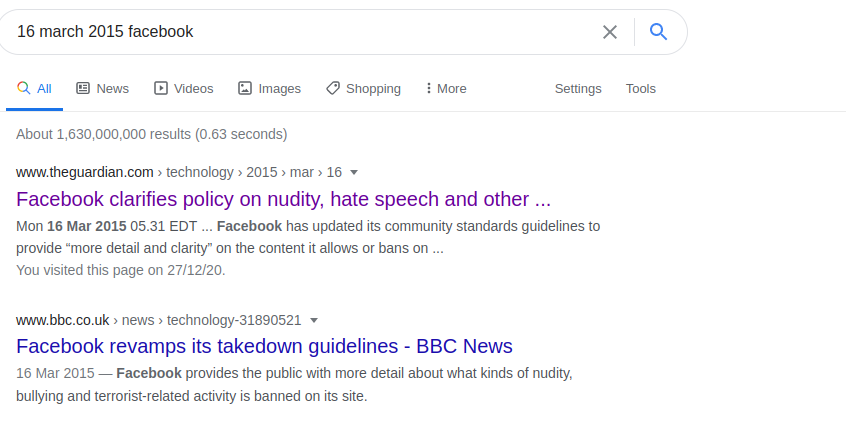

# Prophet <br>
source(https://facebook.github.io/prophet/)

#### Rename columns to avoid error! 
ValueError: Dataframe must have columns "ds" and "y" with the dates and values respectively.

In [52]:
df_prophet = df.copy()
df_prophet = df_prophet.rename(columns={"timestamp":"ds", "value":"y"})
df_prophet

,ds,y
0,2015-02-26 21:42:53,53
1,2015-02-26 21:47:53,64
2,2015-02-26 21:52:53,49
3,2015-02-26 21:57:53,48
4,2015-02-26 22:02:53,22
...,...,...
15828,2015-04-22 20:42:53,93
15829,2015-04-22 20:47:53,101
15830,2015-04-22 20:52:53,132
15831,2015-04-22 20:57:53,78


In [53]:

prophet_model = Prophet(weekly_seasonality = True,
                seasonality_mode = 'multiplicative')
prophet_model_fit = prophet_model.fit(df_prophet)
fit_predict_df = prophet_model_fit.predict(df_prophet)
fit_predict_df['value'] = df_prophet['y'].reset_index(drop = True)
    
fit_predict_df

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,daily,daily_lower,daily_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,weekly,weekly_lower,weekly_upper,additive_terms,additive_terms_lower,additive_terms_upper,yhat,value
0,2015-02-26 21:42:53,37.548135,24.762642,70.264664,37.548135,37.548135,0.226816,0.226816,0.226816,0.259207,0.259207,0.259207,0.032392,0.032392,0.032392,0.0,0.0,0.0,47.280877,53
1,2015-02-26 21:47:53,37.526218,25.507317,68.201376,37.526218,37.526218,0.210858,0.210858,0.210858,0.243107,0.243107,0.243107,0.032249,0.032249,0.032249,0.0,0.0,0.0,46.649117,64
2,2015-02-26 21:52:53,37.504300,23.354712,68.540081,37.504300,37.504300,0.194956,0.194956,0.194956,0.227074,0.227074,0.227074,0.032118,0.032118,0.032118,0.0,0.0,0.0,46.020555,49
3,2015-02-26 21:57:53,37.482383,21.992876,67.165868,37.482383,37.482383,0.179148,0.179148,0.179148,0.211145,0.211145,0.211145,0.031997,0.031997,0.031997,0.0,0.0,0.0,45.396610,48
4,2015-02-26 22:02:53,37.460465,21.755875,67.738152,37.460465,37.460465,0.163471,0.163471,0.163471,0.195358,0.195358,0.195358,0.031888,0.031888,0.031888,0.0,0.0,0.0,44.778675,22
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15828,2015-04-22 20:42:53,21.354035,13.213220,57.498853,21.354035,21.354035,0.408809,0.408809,0.408809,0.711270,0.711270,0.711270,0.302462,0.302462,0.302462,0.0,0.0,0.0,36.542528,93
15829,2015-04-22 20:47:53,21.357230,11.501403,58.076746,21.357230,21.357230,0.395108,0.395108,0.395108,0.697281,0.697281,0.697281,0.302173,0.302173,0.302173,0.0,0.0,0.0,36.249218,101
15830,2015-04-22 20:52:53,21.360425,13.881159,57.423503,21.360425,21.360425,0.381029,0.381029,0.381029,0.682902,0.682902,0.682902,0.301872,0.301872,0.301872,0.0,0.0,0.0,35.947493,132
15831,2015-04-22 20:57:53,21.363621,14.065114,57.919857,21.363621,21.363621,0.366604,0.366604,0.366604,0.668163,0.668163,0.668163,0.301559,0.301559,0.301559,0.0,0.0,0.0,35.637994,78


In [54]:
prophet_outliers = fit_predict_df[['ds','trend', 'yhat', 'yhat_lower', 'yhat_upper', 'value']].copy()

prophet_outliers['anomaly'] = 0
prophet_outliers.loc[prophet_outliers['value'] > prophet_outliers['yhat_upper'], 'anomaly'] = 1
prophet_outliers.loc[prophet_outliers['value'] < prophet_outliers['yhat_lower'], 'anomaly'] = -1


prophet_outliers

,ds,trend,yhat,yhat_lower,yhat_upper,value,anomaly
0,2015-02-26 21:42:53,37.548135,47.280877,24.762642,70.264664,53,0
1,2015-02-26 21:47:53,37.526218,46.649117,25.507317,68.201376,64,0
2,2015-02-26 21:52:53,37.504300,46.020555,23.354712,68.540081,49,0
3,2015-02-26 21:57:53,37.482383,45.396610,21.992876,67.165868,48,0
4,2015-02-26 22:02:53,37.460465,44.778675,21.755875,67.738152,22,0
...,...,...,...,...,...,...,...
15828,2015-04-22 20:42:53,21.354035,36.542528,13.213220,57.498853,93,1
15829,2015-04-22 20:47:53,21.357230,36.249218,11.501403,58.076746,101,1
15830,2015-04-22 20:52:53,21.360425,35.947493,13.881159,57.423503,132,1
15831,2015-04-22 20:57:53,21.363621,35.637994,14.065114,57.919857,78,1


In [55]:
y_hat = alt.Chart(prophet_outliers).mark_area(interpolate="basis", color = 'Gray', opacity=0.7).encode(
    x=alt.X('ds:T'),
    y='yhat_upper',
    y2='yhat_lower'
    ).interactive().properties(
        title='Prophet Anomaly Detection'
    )

data_prophet = alt.Chart(prophet_outliers[prophet_outliers.anomaly==0]).mark_circle(
        size=15, opacity=0.3, color = 'blue').encode(
        x='ds:T',
        y=alt.Y('value', title='number of word appearances'),    
        tooltip=['ds', 'value', 'yhat_lower', 'yhat_upper']
    ).interactive()

outliers_prophet = alt.Chart(prophet_outliers[prophet_outliers.anomaly!=0]).mark_circle(
        size=40, color = 'Red', opacity=0.3).encode(
        x='ds:T',
        y=alt.Y('value', title='number of word appearances'),    
        tooltip=['ds', 'value', 'yhat_lower', 'yhat_upper']
    ).interactive()

In [56]:
chart_prophet = alt.layer(y_hat, data_prophet, outliers_prophet)\
              .properties(width=870, height=250)\
              .configure_title(fontSize=20)
              
chart_prophet

alt.LayerChart(...)

In [ ]:
chart_compare = alt.layer(outliers_forest, outliers_prophet)\
              .properties(width=870, height=250)\
              .configure_title(fontSize=20).properties(
        title='Prophet/ Isolation Forest Outlier Comparison'
    )

In [57]:
chart_compare

alt.LayerChart(...)

# DBSCAN

 Density-Based Spatial Clustering of Applications with Noise. Finds core samples of high density and expands clusters from them. Good for data which contains clusters of similar density.
 
 source: https://scikit-learn.org/stable/modules/generated/sklearn.cluster.DBSCAN.html

In [58]:
df_dbscan = df.copy()
df_dbscan["timestamp"] = pd.to_datetime(df_dbscan["timestamp"])
df_dbscan["timestamp"] = (df_dbscan["timestamp"] - dt.datetime(1970,1,1)).dt.total_seconds()

df_dbscan

,timestamp,value
0,1.424987e+09,53
1,1.424987e+09,64
2,1.424988e+09,49
3,1.424988e+09,48
4,1.424988e+09,22
...,...,...
15828,1.429735e+09,93
15829,1.429736e+09,101
15830,1.429736e+09,132
15831,1.429736e+09,78


In [59]:
DBSCAN_model = DBSCAN(
 eps = 0.001, 
 metric="euclidean", 
 min_samples =1000)
outliers_dbscan = DBSCAN_model.fit(df_dbscan)
anomaly = df_dbscan[outliers_dbscan.labels_==-1]
anomaly

,timestamp,value
0,1.424987e+09,53
1,1.424987e+09,64
2,1.424988e+09,49
3,1.424988e+09,48
4,1.424988e+09,22
...,...,...
15828,1.429735e+09,93
15829,1.429736e+09,101
15830,1.429736e+09,132
15831,1.429736e+09,78


In [ ]:
data_dbscan = alt.Chart(df_dbscan[outliers_dbscan.labels_!=-1]).mark_circle(size=15, opacity=0.5, color = 'Green').encode(
        x='timestamp:T',
        y=alt.Y('value', title='number of word appearances'),    
    ).interactive()

outliers_dbscan = alt.Chart(df_dbscan[outliers_dbscan.labels_==-1]).mark_circle(size=20, color = 'black').encode(
        x='timestamp:T',
        y=alt.Y('value', title='number of word appearances'),
    tooltip=['timestamp:T', 'value']
    ).interactive()

chart_dbscan = alt.layer(data_dbscan, outliers_dbscan)\
              .properties(width=870, height=250)\
              .configure_title(fontSize=20)
            

In [60]:
  
chart_dbscan

alt.LayerChart(...)

## When does DBSCAN work?

In [61]:
df2 = pd.read_csv("art_daily_flatmiddle.csv")
df2

,timestamp,value
0,2014-04-01 00:00:00,-21.048383
1,2014-04-01 00:05:00,-20.295477
2,2014-04-01 00:10:00,-18.127229
3,2014-04-01 00:15:00,-20.171665
4,2014-04-01 00:20:00,-21.223762
...,...,...
4027,2014-04-14 23:35:00,-18.083562
4028,2014-04-14 23:40:00,-20.278406
4029,2014-04-14 23:45:00,-20.063239
4030,2014-04-14 23:50:00,-20.751973


In [62]:
initial_chart = alt.Chart(df2).mark_circle(interpolate="basis", color = 'Gray', opacity=0.7).encode(
    x=alt.X('timestamp:T'),
    y='value'
    ).interactive().properties(
        title='Data'
    )

In [63]:
initial_chart

alt.Chart(...)

In [64]:
df2_dbscan = df2.copy()
df2_dbscan["timestamp"] = pd.to_datetime(df2["timestamp"])
df2_dbscan["timestamp"] = (df2_dbscan["timestamp"] - dt.datetime(1970,1,1)).dt.total_seconds()

df2_dbscan

,timestamp,value
0,1.396310e+09,-21.048383
1,1.396311e+09,-20.295477
2,1.396311e+09,-18.127229
3,1.396311e+09,-20.171665
4,1.396312e+09,-21.223762
...,...,...
4027,1.397518e+09,-18.083562
4028,1.397519e+09,-20.278406
4029,1.397519e+09,-20.063239
4030,1.397519e+09,-20.751973


In [65]:
DBSCAN_model = DBSCAN(
 eps = 7, 
 metric="euclidean", 
 min_samples =700)
outliers2_dbscan = DBSCAN_model.fit(df2_dbscan[["value"]])
anomaly2 = df2_dbscan[outliers2_dbscan.labels_==-1]
anomaly2

,timestamp,value
108,1.396343e+09,55.464261
109,1.396343e+09,62.467039
110,1.396343e+09,65.665293
111,1.396344e+09,54.523204
112,1.396344e+09,55.125947
...,...,...
3967,1.397500e+09,-0.000009
3968,1.397501e+09,-0.000009
3969,1.397501e+09,-0.000010
3970,1.397501e+09,-0.000010


In [ ]:
data_dbscan2 = alt.Chart(df2_dbscan[outliers2_dbscan.labels_!=-1]).mark_circle(size=15, opacity=0.5, color = 'Green').encode(
        x='timestamp:T',
        y=alt.Y('value', title='value(units)'),    
    ).interactive()

outliers_dbscan2 = alt.Chart(df2_dbscan[outliers2_dbscan.labels_==-1]).mark_circle(size=30, color = 'red').encode(
        x='timestamp:T',
        y=alt.Y('value', title='value(units)'),
    tooltip=['timestamp:T', 'value']
    ).interactive()

chart_dbscan2 = alt.layer(data_dbscan2, outliers_dbscan2)\
              .properties(width=870, height=250)\
              .configure_title(fontSize=20)
   

In [66]:
           
chart_dbscan2

alt.LayerChart(...)